In [4]:
import os

import numpy as np
import matplotlib.pyplot as plt
import corner

import arviz as az

In [5]:


trace_file = 'trace.nc'



fin = '../results/MICE_apj/O5_v3_spec_test3_h0_fixOm'



trace_name = os.path.join(fin, trace_file)

trace_name


'../results/MICE_apj/O5_v3_spec_test3_h0_fixOm/trace.nc'

In [6]:
950/4

237.5

In [7]:
PLPeakO3params = {'alpha': 3.4,
 'beta': 1.1,
 'mh': 87,
 'ml': 5.1,
 'lambdaPeak': 0.039,
 'muMass': 34,
 'sigmaMass': 3.6,
 'deltam': 4.8,
 
  'gamma':2.7,    
'kappa':3., 
    'zp':2.,
  
                  
    'H0': 70,
     'Om': 0.25,
                     }

names = ['H0', 'gamma',  'kappa', 'zp', 'lambdaPeak', 'alpha', 'beta', 'deltam', 'ml', 'mh', 'muMass', 'sigmaMass',
 ]

truths = [ PLPeakO3params[k] for k in names ]

In [8]:
trace = az.from_netcdf(trace_name)

In [9]:
trace

Inference data with groups:
	> posterior
	> sample_stats
	> observed_data

In [10]:
az.summary( trace, var_names=names ).round(2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
H0,56.14,19.43,20.43,92.86,0.95,0.67,383.0,364.0,1.01
gamma,3.21,2.55,0.02,8.59,0.14,0.10,342.0,565.0,1.02
kappa,2.80,1.74,0.00,5.61,0.07,0.05,506.0,224.0,1.00
zp,1.51,1.16,0.02,3.61,0.06,0.04,349.0,384.0,1.01
lambdaPeak,0.07,0.04,0.01,0.13,0.00,0.00,249.0,405.0,1.02
alpha,3.25,0.28,2.76,3.78,0.01,0.01,533.0,637.0,1.01
beta,1.89,0.57,0.87,3.06,0.02,0.01,926.0,828.0,1.00
deltam,3.79,2.36,0.09,8.26,0.16,0.12,211.0,273.0,1.01
ml,5.74,0.87,3.99,7.12,0.06,0.04,201.0,321.0,1.02
mh,113.28,27.54,76.02,174.43,1.40,0.99,347.0,689.0,1.01


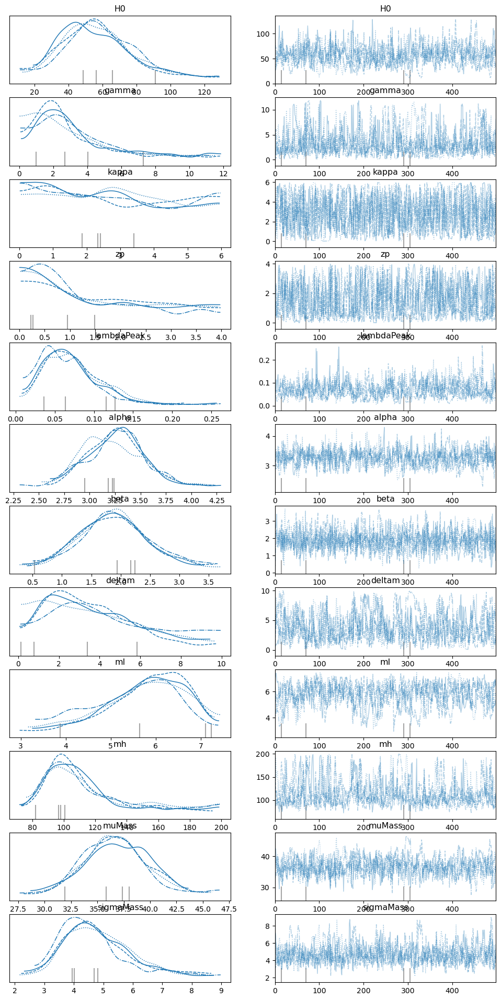

In [11]:
az.plot_trace(trace, 
              combined=False,
              var_names=names, 
              lines=[]
             );

plt.savefig(os.path.join(fin, 'trace_plot.pdf'), bbox_inches='tight')

plt.show()

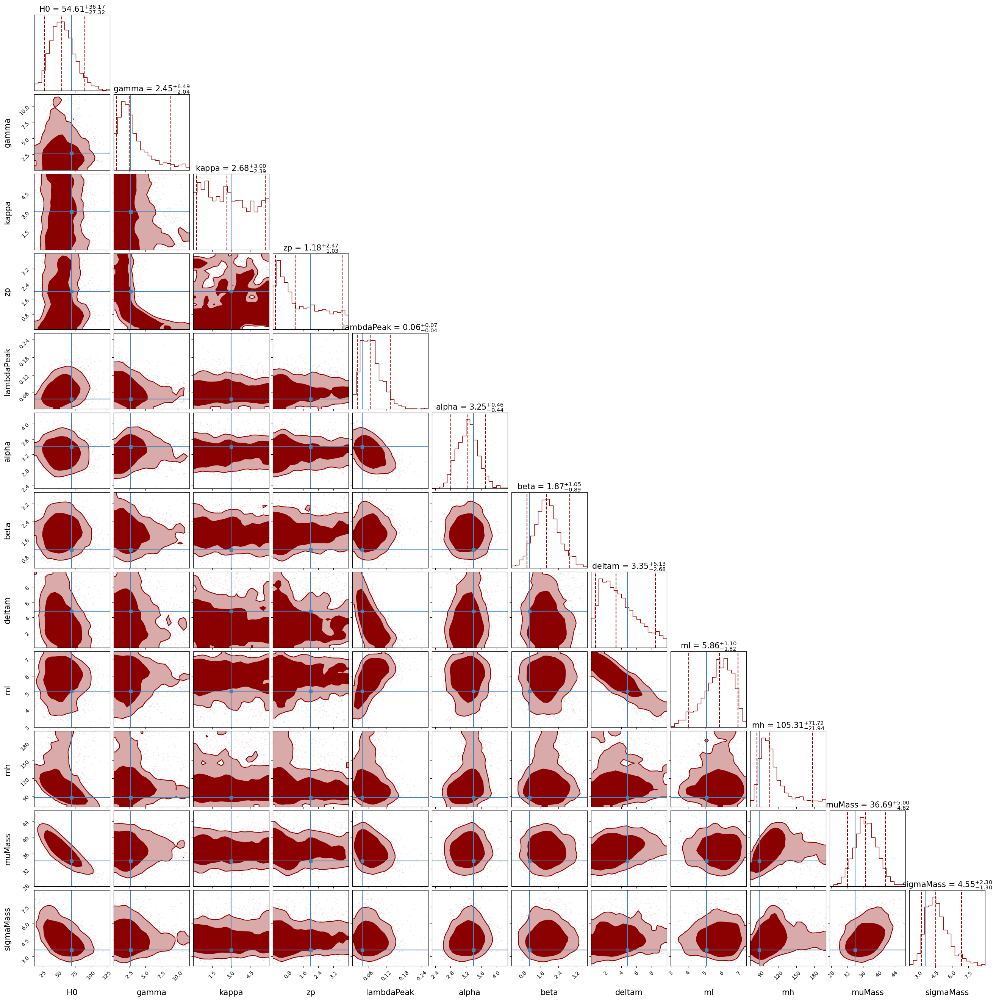

In [12]:
_ = corner.corner(
    trace,
    var_names=names,
    labels=names,  
    truths=truths,
    color='darkred',
    plot_points=False,
    levels=[0.68, 0.90],
    show_titles=True, 
    title_kwargs={"fontsize": 15, }, label_kwargs={"fontsize": 15},
    density=True,
    smooth=0.9, 
    fill_contours=True,
     bins=20, 
    title_fmt='.2f', 
    hist_bin_factor=1,
    quantiles=[0.05, 0.5, 0.95],
    #range=rr
)

#plt.savefig(os.path.join(in_dir, fname_2+'_corner.pdf'), bbox_inches='tight')

plt.savefig(os.path.join(fin, 'corner.pdf'), bbox_inches='tight')

plt.show()

In [13]:
stacked = az.extract(trace)
#stacked

In [14]:
allchains = np.asarray([ stacked[name].values for name in names])
allchains.shape

(12, 2000)

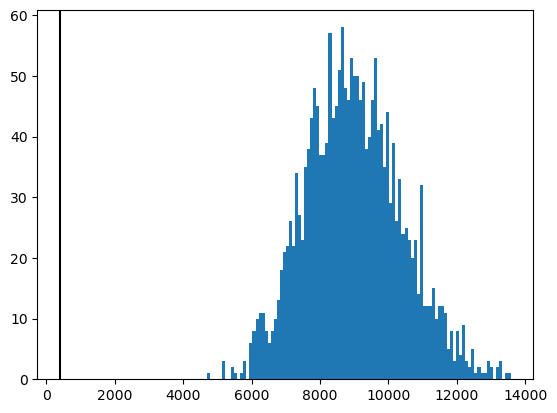

In [15]:

_ = plt.hist( np.squeeze(np.asarray([ stacked['Neff'].values ])), bins=100) #np.geomspace(1e02,1e05,100))
#plt.xscale('log')
plt.axvline(4*100, color='k')
plt.savefig(os.path.join(fin, 'Neff.pdf'), bbox_inches='tight')

In [16]:
# Find point with lowest variance


llv = np.squeeze(np.asarray([ stacked['log_lik_var'].values ]))

llvmin = np.argmin(llv)

# take init point with low variance

#print(llvmin, llv[llvmin])

iv = {}
for n in names[:-1]:
    #print(n)
    iv[n] = np.asarray([ stacked[n].values ])[:, llvmin][0]

iv['H0'] = 70
iv['Om'] = 0.25
iv['Xi0'] = 1
iv['n'] = 0

iv

{'H0': 70,
 'gamma': 0.621350324933365,
 'kappa': 1.8386408331618085,
 'zp': 0.7991800295435276,
 'lambdaPeak': 0.034735805139248545,
 'alpha': 3.0086054801996744,
 'beta': 1.1608599556184211,
 'deltam': 5.952244955126617,
 'ml': 4.613800072363576,
 'mh': 116.2506371228874,
 'muMass': 36.84047028867788,
 'Om': 0.25,
 'Xi0': 1,
 'n': 0}

In [17]:
import json

with open('../pymcpop-gw/initvals_files/init_MICE_sim_apj_lowVar.json', 'w') as fp:
    json.dump(iv, fp)

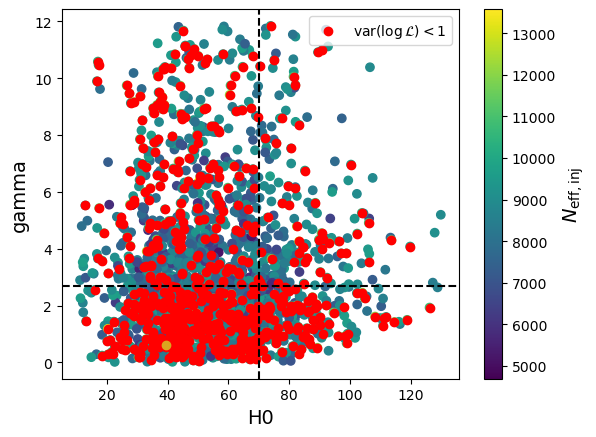

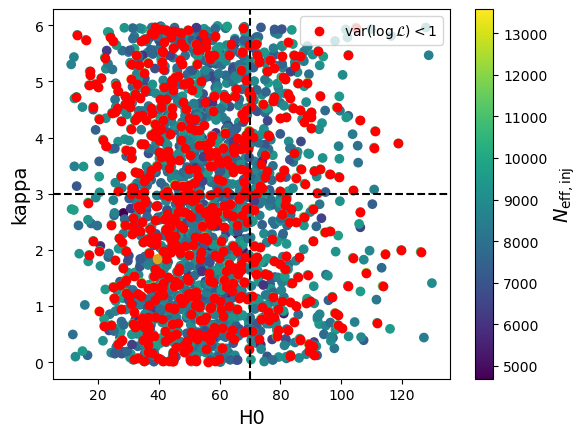

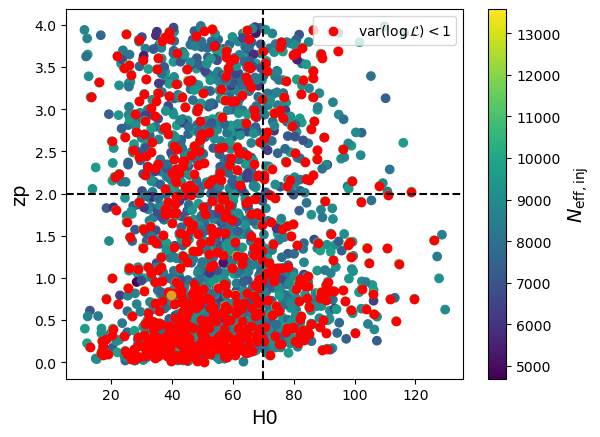

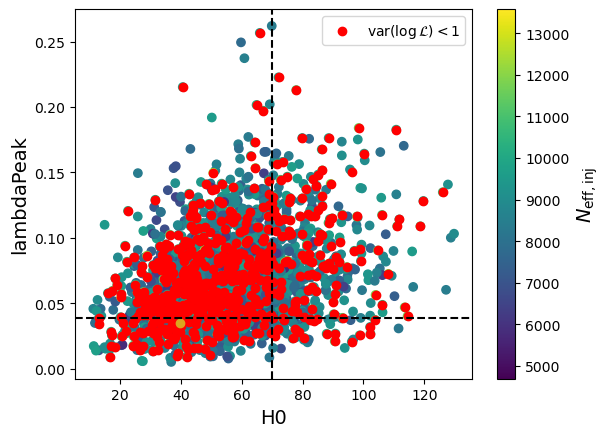

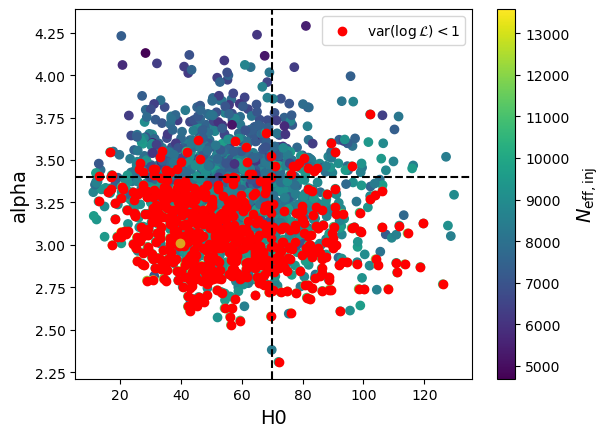

...

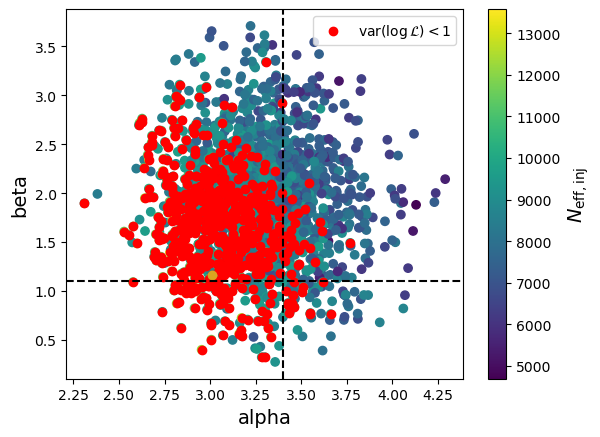

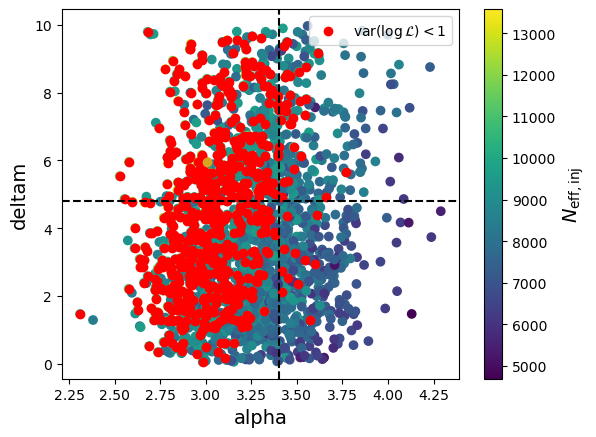

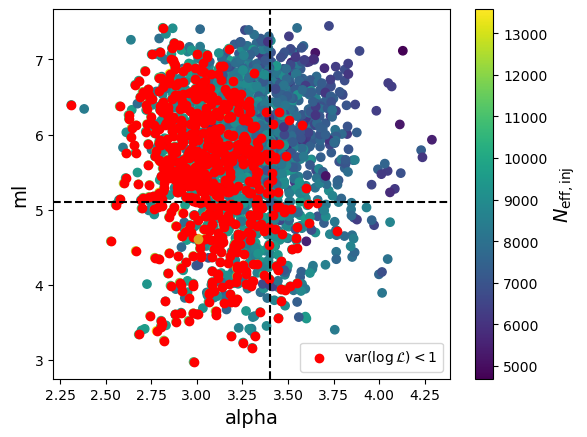

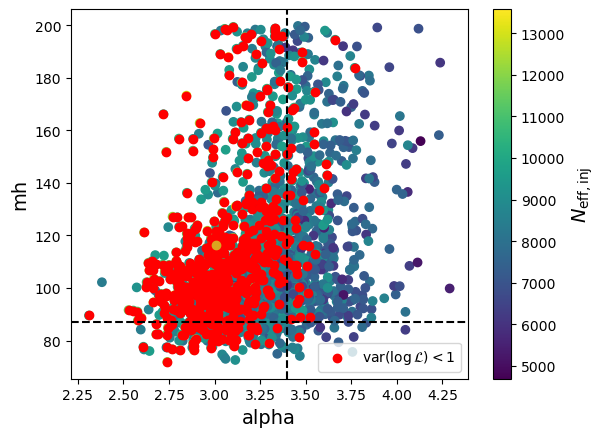

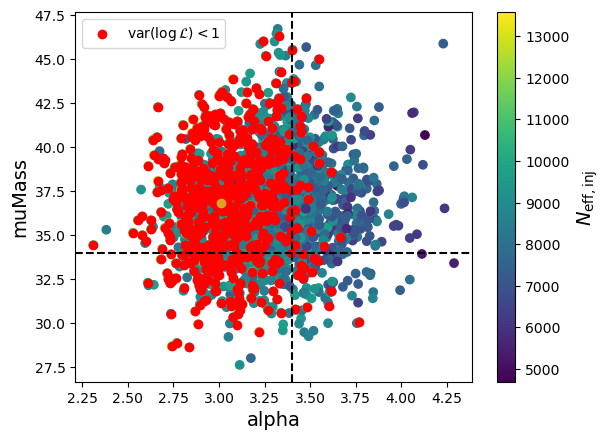

In [ ]:
p1='H0'
p2='mh'

lvmax=1

llvth=llv<lvmax


for i,p1 in enumerate(names):
    for p2 in names[i+1:]:

        plt.scatter(np.asarray([ stacked[p1].values ]), np.asarray([ stacked[p2].values ]),
                    c = np.asarray([ stacked['Neff'].values ]))
        
        
        cbar=plt.colorbar()
        cbar.set_label(r'$N_{\rm eff, inj}$', fontsize=14)
        
        plt.scatter(np.asarray([ stacked[p1].values ])[:, llvth], np.asarray([ stacked[p2].values ])[:, llvth],
                    c = 'red', label=r'${\rm var}(\log \mathcal{L})<%s$'%lvmax)
        
        plt.scatter(np.asarray([ stacked[p1].values ])[:, llvmin], np.asarray([ stacked[p2].values ])[:, llvmin],
                    c = 'goldenrod')
        
        #plt.savefig(os.path.join(fin, 'corner_muSig_lowVar.pdf'), bbox_inches='tight')
        plt.legend()
        #legend
        
        plt.axhline(PLPeakO3params[p2], ls='--', c='k')
        plt.axvline(PLPeakO3params[p1], ls='--', c='k')
        plt.xlabel(r'%s'%p1, fontsize=14)
        plt.ylabel(r'%s'%p2, fontsize=14)
        plt.show()

In [ ]:
_ = plt.hist( np.squeeze(np.asarray([ stacked['log_lik_var'].values ])), bins=100) #np.geomspace(1e02,1e05,100))
#plt.xscale('log')
#plt.axvline(4*100, color='k')
plt.savefig(os.path.join(fin, 'log_lik_var.pdf'), bbox_inches='tight')

### Plot with MCMC with emcee

In [ ]:
## MCMC samples

import h5py

def read_chain(data_path):

    with h5py.File(os.path.join(data_path, 'chain_final_clean.h5'), 'r') as inp:
        samples = np.array(inp['chain'])
        weights = np.array(inp['weights'])
    return samples, weights



In [ ]:
fin_emcee = '/Users/Michi/Library/CloudStorage/Dropbox/Local/Physics_projects/MGCosmoPop/results/CHIMERAtests/run_CHIMERA_O5_noiseless_snrth-25_100evsample_injections_20M_plpv9_v1'

In [ ]:
samples, weights = read_chain(fin_emcee)

print('Samples loaded from %s' %os.path.join(fin_emcee, 'chain_final_clean.h5'))

In [ ]:

samples.shape

In [ ]:
allchains = np.asarray([ stacked[name].values for name in names])
allchains.shape

In [ ]:
names

In [ ]:
myrange = [  ( min( allchains[i].min(), samples[:, i].min() ), 
              max( allchains[i].max(), samples[:, i].max() ) ) for i in range(len(names)) ]

myrange

In [ ]:
len(names), len(samples)

In [ ]:
figure = corner.corner(
    #allchains.T,
    trace,
    var_names=names,
    labels=names,  
    #truths=truths,
    color='darkred',
    plot_points=True,
    levels=[0.68, 0.90],
    show_titles=True, 
    title_kwargs={"fontsize": 15, }, label_kwargs={"fontsize": 15},
    density=True,
    smooth=0.9, 
    fill_contours=True,
     bins=20, 
    title_fmt='.2f', 
    hist_bin_factor=1,
    quantiles=[0.05, 0.5, 0.95],
    range=myrange,
    #weights=np.ones(allchains.shape[-1])/allchains.shape[-1]*len(samples_load)
    
)

fig = corner.corner(
    samples,
    fig=figure,
    #var_names=names,
    labels=names,  
    truths=truths,
    color='darkblue',
    plot_points=False,
    levels=[0.68, 0.90],
    show_titles=True, 
    title_kwargs={"fontsize": 15, }, label_kwargs={"fontsize": 15},
    density=True,
    smooth=0.9, 
    fill_contours=True,
     bins=20, 
    title_fmt='.2f', 
    hist_bin_factor=1,
    quantiles=[0.05, 0.5, 0.95],
    range=myrange,
    weights=np.ones( len(samples))/len(samples)*allchains.shape[-1] 
)

#plt.savefig(os.path.join(in_dir, fname_2+'_corner.pdf'), bbox_inches='tight')

plt.savefig(os.path.join(fin, 'corner_with_emcee.pdf'), bbox_inches='tight')

plt.show()